In [1]:
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
import torchvision.transforms as Tf

from src.data import CATARACTS, Cataract101, Img2ImgDataset

In [2]:
N = 4
T = 10

In [3]:
print('##### Loading CATARACTS2020 data')
test_ds_A = CATARACTS(
    root="/local/scratch/CATARACTS-videos-processed/",
    n_seq_frames=T,
    dt=T,
    transforms=Tf.Compose([
        # Tf.RandomCrop((1080, 1080)),
        # Tf.Pad([0, 420]),
        Tf.Resize((320, 320)),
        Tf.RandomChoice([
            Tf.RandomHorizontalFlip(),
            Tf.RandomVerticalFlip(),
            # Tf.RandomRotation(90)
        ], p=[0.3, 0.3])
    ]),
    # phases=[0, 3, 5, 6, 8, 10, 13, 14],
    split="Test")
print("##### Loading Cataract101 data")
test_ds_B = Cataract101(
    root="/local/scratch/cataract-101-processed/",
    n_seq_frames=T,
    dt=T,
    transforms=Tf.Compose([
        Tf.RandomCrop((540, 540)),
        Tf.Resize((320, 320)),
        Tf.RandomChoice([
            Tf.RandomHorizontalFlip(),
            Tf.RandomVerticalFlip(),
            # Tf.RandomRotation(90)
        ], p=[0.3, 0.3])
    ]),
    # phases=[1, 3, 4, 5, 6, 8],
    split="Test")

##### Loading CATARACTS2020 data
##### Loading Cataract101 data


In [4]:
test_ds = Img2ImgDataset(ds_A=test_ds_A, ds_B=test_ds_B)
test_dl = DataLoader(test_ds, batch_size=N, shuffle=True, drop_last=True)

In [5]:
sample = next(iter(test_dl))

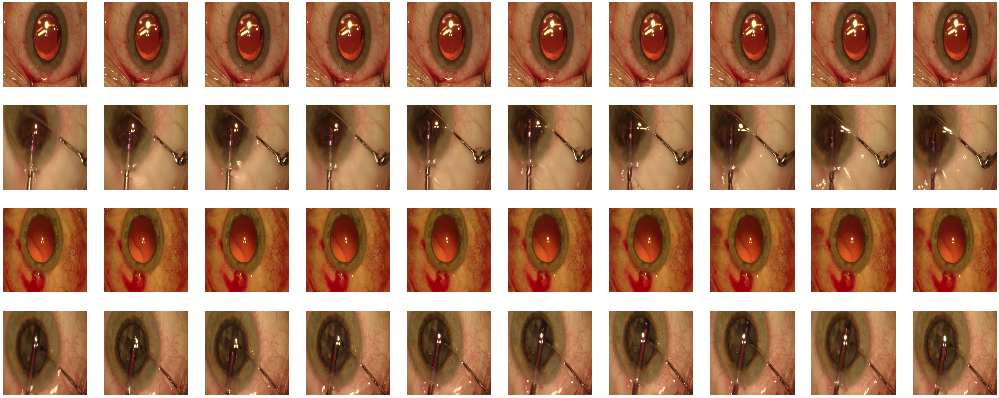

In [6]:
fig, ax = plt.subplots(N, T, figsize=(T*5, N*5))
for n in range(N):
    for t in range(T):
        ax[n, t].axis('off')
        ax[n, t].imshow(sample['A'][n, t].permute(1, 2, 0))

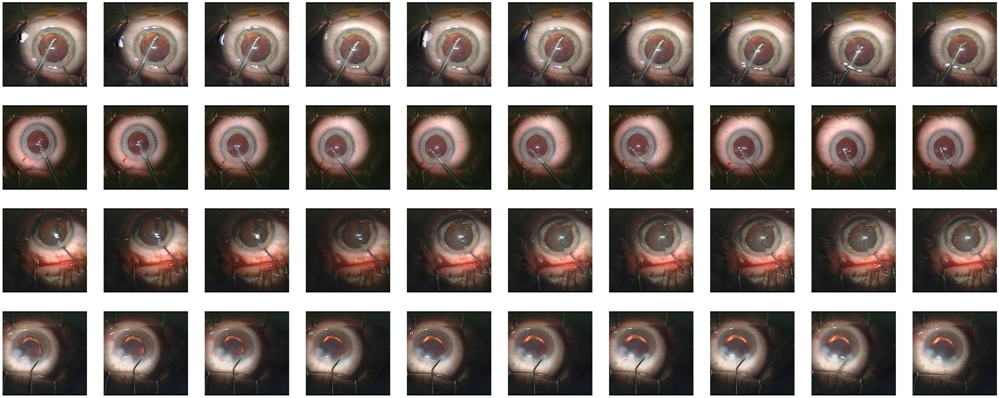

In [7]:
fig, ax = plt.subplots(N, T, figsize=(T*5, N*5))
for n in range(N):
    for t in range(T):
        ax[n, t].axis('off')
        ax[n, t].imshow(sample['B'][n, t].permute(1, 2, 0))